# Self-Driving Car Engineer Nanodegree


## Project: **Advanced Lane Finding** 

**Desciption:** This projects aims to create a lane detector for given video inputs.  
**Approach:** Initially, heuristic approach is used to detect optimum parameters then those parameters are used in the pipeline.  

The pipeline is given below.

**The pipeline** is described as follows:

1. Camera Calibration
    * Finding Camera Matrix and Distortion Coefficients
    * Distortion Correction
2. Gradients & Color Space Transform
3. Perspective Transform
4. Lane Pixel Detection
    * Part 1: Histogram
    * Part 2: Sliding Windows Search
    * Part 3: Searching Around a Previously Detected Line
5. Image Augmentation

#### Importing Required Libraries

In [21]:
import cv2
import glob
import pickle
import numpy as np
import PIL
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

%matplotlib inline

### 1. Camera Calibration

#### Checking the first checkerboard image

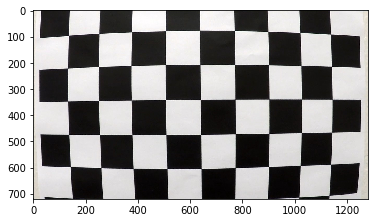

In [47]:
files = glob.glob('./camera_cal/calibration*.jpg')
img1 = mpimg.imread(sorted(files)[0])
plt.imshow(img1)

In [57]:
# To display the results in a window use --> %matplotlib qt

# Chessboard size
nx, ny = 9, 6

# Arrays to store 'object points' & 'image points'
objpoints = [] #3D points in "real world" space
imgpoints = [] #2D points in image plane

# Prepare object points
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) #x,y coords

# Reading images
checkerboards = glob.glob('./camera_cal/calibration*.jpg')
imshape = img1.shape

detected_corners = []

# Iterating images
for fname in checkerboards:
    img = mpimg.imread(fname) #read in each image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) #convert image to grayscale
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None) #find the chessboard corners
        
    # If corners found: Add object points, image points
    if ret==True:
        imgpoints.append(corners)
        objpoints.append(objp)
        # Drawing corners (optional)
        drawCb = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        detected_corners.append(drawCb)

# Calibrating camera and finding the camera matrix and the distortion coefficients
ret, cameraMatrix, distortionCoeffs, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, imshape[:2],None,None)

#### Drawing the Corners

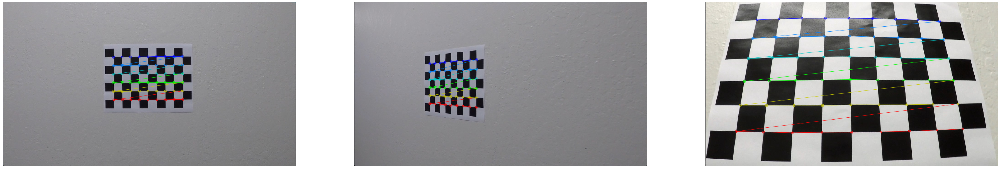

In [58]:
plt.figure(figsize=(64,36))

plt.subplot(131), plt.imshow(detected_corners[0])
plt.title(None, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

plt.subplot(132), plt.imshow(detected_corners[1])
plt.title(None, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

plt.subplot(133), plt.imshow(detected_corners[2])
plt.title(None, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

plt.show() #to block out the text output!

#### Testing the Distortion Correction

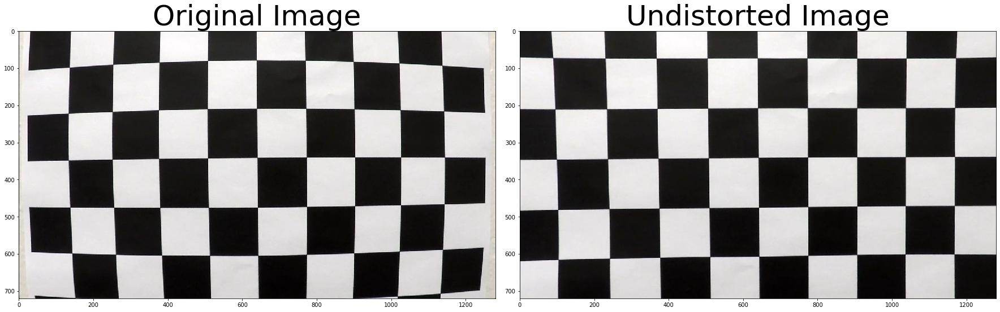

In [68]:
cb = mpimg.imread(checkerboards[6])
undistorted = cv2.undistort(cb, cameraMatrix, distortionCoeffs, None, cameraMatrix)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cb)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### 2. Gradients & Color Space Transforms

#### 2.1 Gradient Transforms

In [9]:
class gradientTransforms:
    '''
    This tool do the following operations on a given image:
    1. Applying Sobel
    2. Magnitude of the Gradient
    3. Direction of the Gradient
    Then returns the thresholded grad. dir.
    '''
    def __init__(self,
                 orient='x',
                 sobel_kernel=3,
                 sobel_th_min=0,
                 sobel_th_max=255,
                 mag_th_min=0,
                 mag_th_max=0,
                 dir_th_min=0,
                 dir_th_max=np.pi/2,
                 turn_gray='yes'):
        self.orient = orient
        self.sobel_kernel = sobel_kernel
        self.sobel_th_min = sobel_th_min
        self.sobel_th_max = sobel_th_max
        self.mag_th_min = mag_th_min
        self.mag_th_max = mag_th_max
        self.dir_th_min = dir_th_min
        self.dir_th_max = dir_th_max
        self.turn_gray = turn_gray


    def abs_sobel_thresh(self, image, orient, sobel_kernel, sobel_th_min, sobel_th_max, turn_gray):

        # Convert to grayscale
        if turn_gray == 'yes':
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        else:
            gray = image

        # Apply x or y gradient with the OpenCV Sobel() function
        # and take the absolute value
        if orient == 'x':
            abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
        if orient == 'y':
            abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))

        # Rescale back to 8 bit integer
        scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

        # Create a copy and apply the threshold
        grad_binary = np.zeros_like(scaled_sobel)

        # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
        grad_binary[(scaled_sobel >= sobel_th_min) & (scaled_sobel <= sobel_th_max)] = 1

        # Return the result    
        return grad_binary



    def mag_thresh(self, image, sobel_kernel, mag_th_min, mag_th_max, turn_gray):

        # Convert to grayscale
        if turn_gray == 'yes':
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        else:
            gray = image

        # Take both Sobel x and y gradients
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

        # Calculate the gradient magnitude
        gradmag = np.sqrt(sobelx**2 + sobely**2)

        # Rescale to 8 bit
        scale_factor = np.max(gradmag)/255 
        gradmag = (gradmag/scale_factor).astype(np.uint8) 

        # Create a binary image of ones where threshold is met, zeros otherwise
        mag_binary = np.zeros_like(gradmag)
        mag_binary[(gradmag >= mag_th_min) & (gradmag <= mag_th_min)] = 1

        # Return the result  
        return mag_binary


    def dir_threshold(self, image, sobel_kernel, dir_th_min, dir_th_max, turn_gray):

        # Convert to grayscale
        if turn_gray == 'yes':
            gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        else:
            gray = image

        # Calculate the x and y gradients
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

        # Take the absolute value of the gradient direction, 
        # apply a threshold, and create a binary image result
        absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
        dir_binary =  np.zeros_like(absgraddir)
        dir_binary[(absgraddir >= dir_th_min) & (absgraddir <= dir_th_max)] = 1

        # Return the result     
        return dir_binary
    
grTran = gradientTransforms()

#### Testing

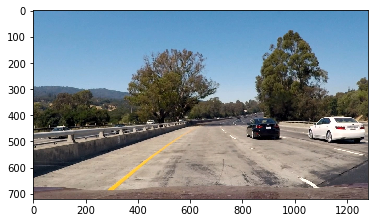

In [10]:
i=0
test_img = mpimg.imread(test_images[i])
plt.imshow(test_img)
plt.show() #to block out the text output!

In [11]:
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = grTran.abs_sobel_thresh(test_img, 'x', ksize, 20, 100, turn_gray='yes')
grady = grTran.abs_sobel_thresh(test_img, 'y', ksize, 20, 100, turn_gray='yes')
mag_binary = grTran.mag_thresh(test_img, ksize, 20, 100, turn_gray='yes')
dir_binary = grTran.dir_threshold(test_img, 15, 0.7, 1.3, turn_gray='yes')

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

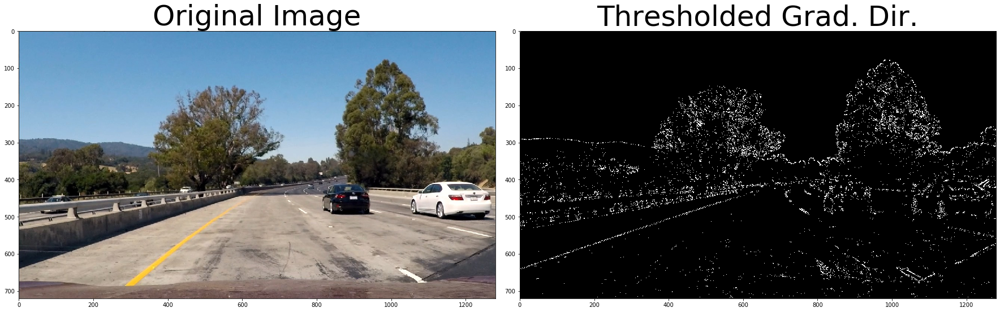

In [12]:
# Plot the test result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### 2.2 Color Transforms

In [13]:
class colorTransforms:
    
    def __init__(self,
                 thresh=(180, 255),
                 channel='R',
                 space='RGB'):
        self.thresh = thresh
        self.channel = channel
        self.space = space
    

    ##### COMBINED FUNCTIONS ##### 
    def compare_org_gray_graybin(self,image,space):
        if(space=='RGB'):
            self.rgb_gray_graybin(image,space)
        if(space=='HLS'):
            self.hls_gray_graybin(image,space)
            
            
    ##### RGB FUNCTIONS #####    
    def rgb_gray_graybin(self, image, space):
        # Gray scale
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

        # Gray binary
        binary_gray = np.zeros_like(gray)
        binary_gray[(gray > self.thresh[0]) & (gray <= self.thresh[1])] = 1

        # Plotting
        plt.figure(figsize=(64,36))

        plt.subplot(131), plt.imshow(image, cmap="gray")
        title1=space+" Space"
        plt.title(title1, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        plt.subplot(132), plt.imshow(gray, cmap="gray")
        title2=space+" Space (Gray)"
        plt.title(title2, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])
        
        title3=space+" Space Binary"
        plt.subplot(133), plt.imshow(binary_gray, cmap="gray")
        plt.title(title3, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        return plt.show() #to block out the text output!
    
    
    def rgb_ingray(self, image):
        R = image[:,:,0]
        G = image[:,:,1]
        B = image[:,:,2]

        # Plotting
        plt.figure(figsize=(64,36))

        plt.subplot(131), plt.imshow(R, cmap="gray")
        plt.title("R", fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        plt.subplot(132), plt.imshow(G, cmap="gray")
        plt.title("G", fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        plt.subplot(133), plt.imshow(B, cmap="gray")
        plt.title("B", fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        return plt.show() #to block out the text output!
    
    
    def rgb_rgbbin(self, image, channel):
        R,G,B = image[:,:,0], image[:,:,1], image[:,:,2]
         
        if(channel=='R'):chan=R
        if(channel=='G'):chan=G
        if(channel=='B'):chan=B
        
        # Color binary
        thresh = (200, 255)
        binary_chan = np.zeros_like(chan)
        binary_chan[(chan > thresh[0]) & (chan <= thresh[1])] = 1

        # Plotting
        plt.figure(figsize=(64,36))
        
        plt.subplot(131), plt.imshow(chan)
        title1=channel+" Channel"
        plt.title(title1, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        plt.subplot(132), plt.imshow(chan, cmap="gray")
        title2=channel+" Channel (Gray)"
        plt.title(title2, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])
        
        title3=channel+" Binary"
        plt.subplot(133), plt.imshow(binary_chan, cmap="gray")
        plt.title(title3, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        return plt.show() #to block out the text output!
    
    
    ##### HLS FUNCTIONS #####
    def hls_gray_graybin(self, image, space):
        image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)

        # Gray scale
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

        # Gray binary
        binary_gray = np.zeros_like(gray)
        binary_gray[(gray > self.thresh[0]) & (gray <= self.thresh[1])] = 1

        # Plotting
        plt.figure(figsize=(64,36))

        plt.subplot(131), plt.imshow(image, cmap="gray")
        title1=space+" Space"
        plt.title(title1, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        plt.subplot(132), plt.imshow(gray, cmap="gray")
        title2=space+" Space (Gray)"
        plt.title(title2, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        title3=space+" Space Binary"
        plt.subplot(133), plt.imshow(binary_gray, cmap="gray")
        plt.title(title3, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        return plt.show() #to block out the text output!

    
    def hls_ingray(self, image):
        # Converting RGB image into HLS space
        hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        H,L,S = hls[:,:,0], hls[:,:,1], hls[:,:,2]

        # Plotting
        plt.figure(figsize=(64,36))

        plt.subplot(131), plt.imshow(H, cmap="gray")
        plt.title("H", fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        plt.subplot(132), plt.imshow(L, cmap="gray")
        plt.title("L", fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        plt.subplot(133), plt.imshow(S, cmap="gray")
        plt.title("S", fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        return plt.show() #to block out the text output!
    
    
    def hls_hlsbin(self, image, channel):
        # Converting RGB image into HLS space
        hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        H,L,S = hls[:,:,0], hls[:,:,1], hls[:,:,2]
         
        if(channel=='H'):chan=H
        if(channel=='L'):chan=L
        if(channel=='S'):chan=S
        
        # Color binary
        thresh = (200, 255)
        binary_chan = np.zeros_like(chan)
        binary_chan[(chan > thresh[0]) & (chan <= thresh[1])] = 1

        # Plotting
        plt.figure(figsize=(64,36))
        
        plt.subplot(131), plt.imshow(chan)
        title1=channel+" Channel"
        plt.title(title1, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        plt.subplot(132), plt.imshow(chan, cmap="gray")
        title2=channel+" Channel (Gray)"
        plt.title(title1, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])
        
        title3=channel+" Binary"
        plt.subplot(133), plt.imshow(binary_chan, cmap="gray")
        plt.title(title3, fontdict={'fontsize':48}), plt.xticks([]), plt.yticks([])

        return plt.show() #to block out the text output!
    
colTran = colorTransforms()

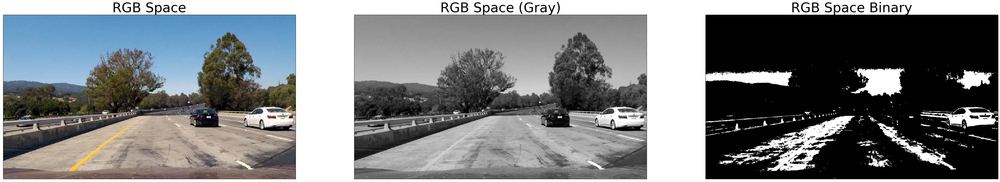

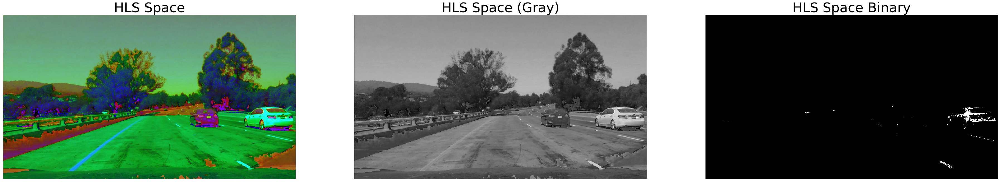

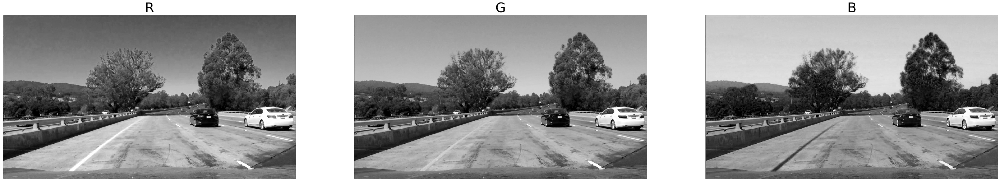

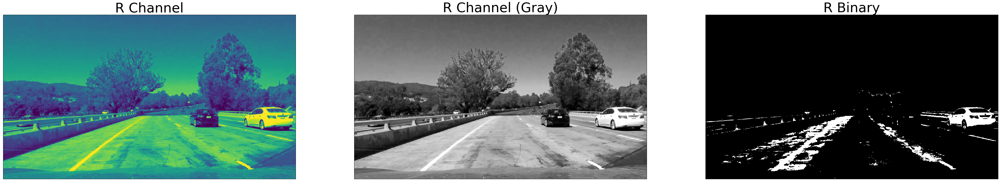

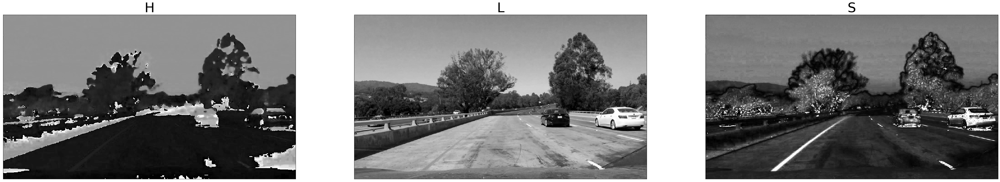

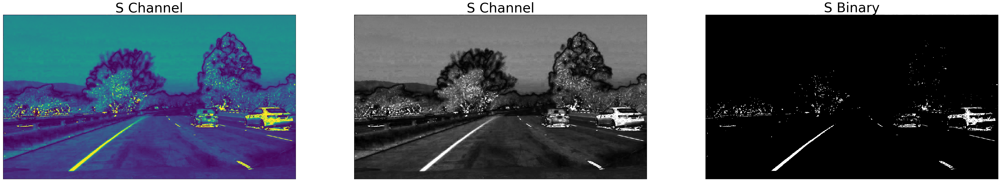

In [14]:
colTran.compare_org_gray_graybin(test_img,space='RGB')
colTran.compare_org_gray_graybin(test_img,space='HLS')
colTran.rgb_ingray(test_img)
colTran.rgb_rgbbin(test_img, channel='R') #channel can be 'R' or 'G' or 'B'
colTran.hls_ingray(test_img)
colTran.hls_hlsbin(test_img, channel='S') #channel can be 'H' or 'L' or 'S'

#### Conclusion:
With the huristic approach, appropriate gradient and color conversion values were determined.  
The S channel is still doing a fairly robust job of picking up the lines under very different color and contrast conditions, while the other selections look messy.  
In general, the **S channel is preferable** because it is **more robust to changing conditions**.

It's worth noting, however, that **the R channel still does rather well on the white lines**, perhaps even better than the S channel.
In addition, **L channel** is performed well for the edges generated due to shadows.
As with gradients, it's worth considering how you might combine various color thresholds to make the most robust identification of the lines.  

Let's apply a combined transformation to the test images.

#### Combined Sobel & Color-Space Transform

In [15]:
def combined_sobel_color_transforms(img):
    
    #Converting HLS & Seperating S Channel
    img_hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    img_S = img_hls[:,:,2]
    
    gradx = grTran.abs_sobel_thresh(img_S, 'x', ksize, 20, 100, turn_gray='no')
    grady = grTran.abs_sobel_thresh(img_S, 'y', ksize, 20, 100, turn_gray='no')
    mag_binary = grTran.mag_thresh(img_S, ksize, 50, 120, turn_gray='no')
    dir_binary = grTran.dir_threshold(img_S, 15, 0.5, 1.3, turn_gray='no')

    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

    # Return the result    
    return combined

In [17]:
test_img

array([[[254, 233, 216],
        [245, 238, 232],
        [196, 205, 212],
        ...,
        [ 16,  35,  52],
        [ 20,  37,  53],
        [ 32,  48,  63]],

       [[245, 238, 232],
        [188, 193, 197],
        [137, 158, 175],
        ...,
        [ 74, 108, 135],
        [ 47,  77, 103],
        [  4,  34,  60]],

       [[193, 202, 209],
        [134, 157, 173],
        [115, 154, 183],
        ...,
        [ 95, 144, 184],
        [ 89, 137, 177],
        [ 52,  97, 136]],

       ...,

       [[141, 131, 129],
        [132, 121, 119],
        [114, 100,  97],
        ...,
        [ 99,  80,  74],
        [ 99,  80,  74],
        [113,  94,  88]],

       [[164, 154, 152],
        [133, 122, 120],
        [120, 106, 103],
        ...,
        [107,  88,  82],
        [109,  90,  84],
        [111,  92,  86]],

       [[189, 179, 177],
        [135, 125, 123],
        [128, 117, 113],
        ...,
        [ 97,  78,  72],
        [ 95,  76,  70],
        [ 73,  54,  48]]

In [16]:
calibrated = camCalibrate(test_img)

TypeError: Object does not appear to be a 8-bit string path or a Python file-like object

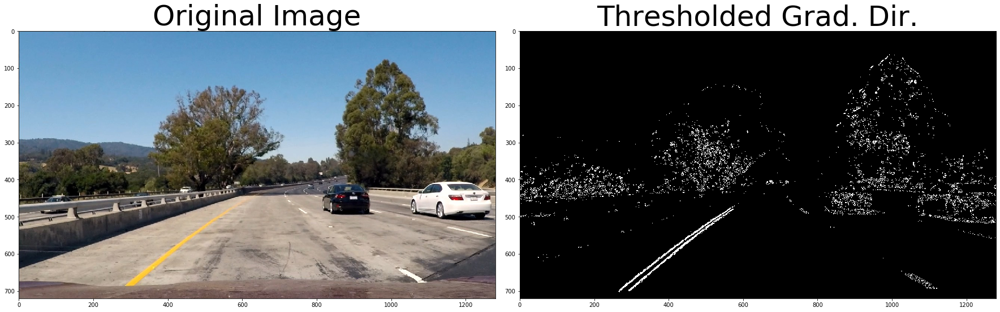

In [22]:
# Plot the test result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

calibrated = camCalibrate(test_img)
combined_sct=combined_sobel_color_transforms(calibrated)

ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(combined_sct, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### 3. Perspective Transform

In [125]:
def perspective_transform(img):
    h,w = img.shape[0], img.shape[1]
    
    # The coordinates of quadrangle vertices in the initial image
    i1,i2,i3,i4 = [w // 2 - 75, h*0.625], [w // 2 + 75,h*0.625], [-100,h], [w+100,h]
    img_in = np.float32([i1,i2,i3,i4])
    
    # The coordinates of quadrangle vertices in the target image
    t1,t2,t3,t4 = [100,0], [w-100,0], [100,h], [w-100,h]
    img_tar = np.float32([t1,t2,t3,t4])
    
    # The perspective transform matrix
    Mpt = cv2.getPerspectiveTransform(img_in, img_tar)
    
    # Warping the image
    img_warped = cv2.warpPerspective(img, Mpt, (w,h))
    
    # Unwarping
    unwarp = cv2.getPerspectiveTransform(img_in,img_tar)
    
    return (img_warped,unwarp)

Image: test_images/test1.jpg


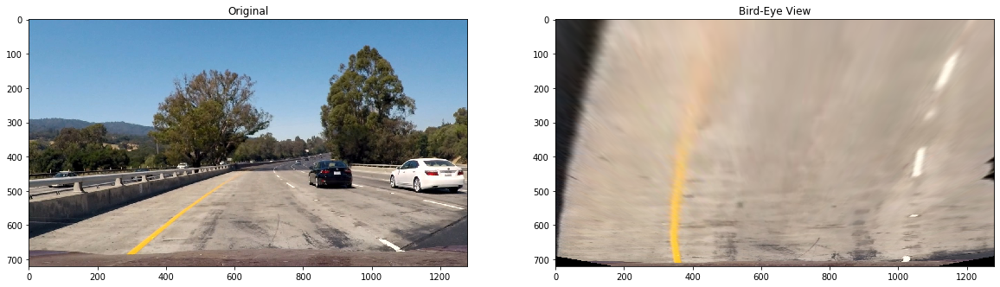

Image: test_images/test2.jpg


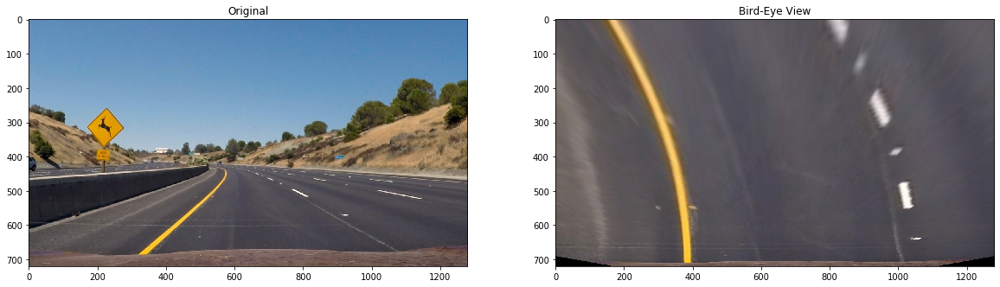

Image: test_images/test3.jpg


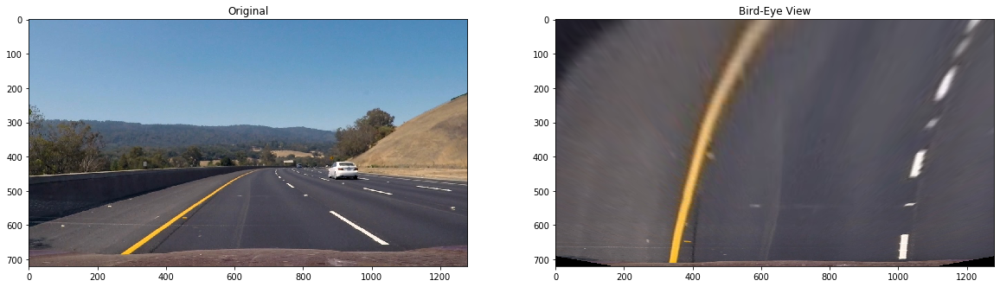

Image: test_images/test4.jpg


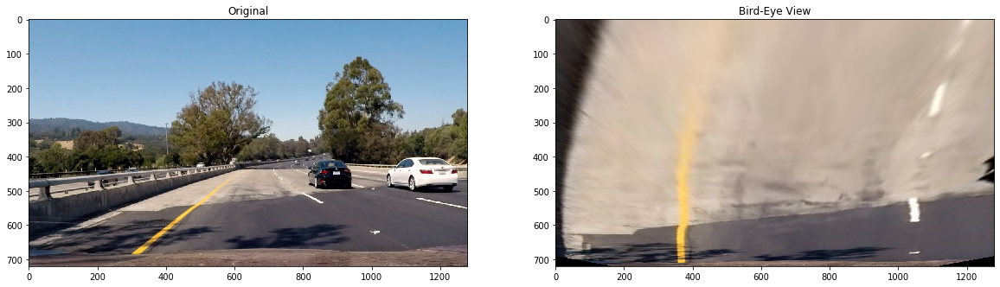

Image: test_images/test5.jpg


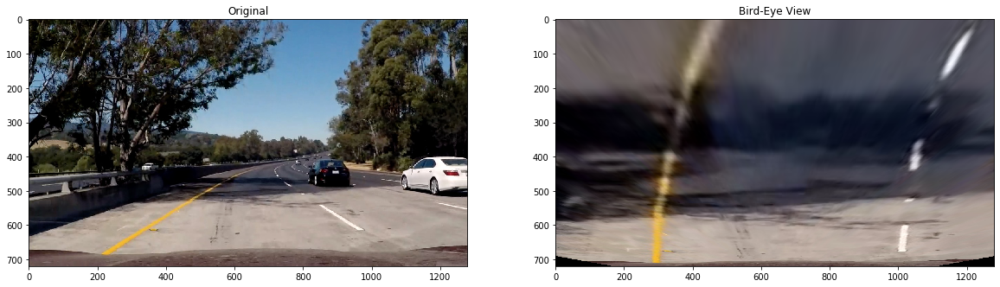

Image: test_images/test6.jpg


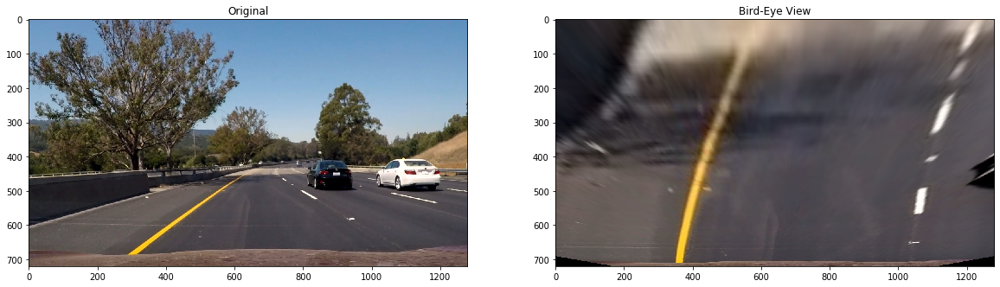

In [126]:
# Plotting thresholded images
for i, path, in enumerate(test_images):
    print("Image: " + test_images[i])
    img = mpimg.imread(test_images[i])
    birdeye, _ = perspective_transform(img) 
    
    _, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('Original')
    ax1.imshow(img)
    ax2.set_title('Bird-Eye View')
    ax2.imshow(birdeye)
    plt.show()

### 4. Lane Pixel Detection

After applying calibration, thresholding, and a perspective transform to a road image, a binary image where the lane lines stand out clearly is created.  
In this section, it's decided explicitly which pixels are part of the lines and which belong to the left line and which belong to the right line.  
Plotting a **histogram** of where the binary activations occur across the image is one potential solution for this.

#### Lane Pixel Detection - Part 1: Histogram

In [20]:
def hist(img):
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:,:]

    # Sum across image pixels vertically - make sure to set an `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram

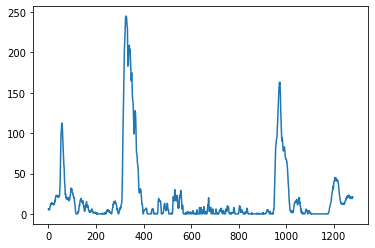

In [22]:
# Load our image
img = mpimg.imread('./test_images_2/warped-example.jpg')/255 #255 for normalizing

# Create histogram of image binary activations
histogram = hist(img)

# Visualize the resulting histogram
plt.plot(histogram)
plt.show() #to block text output

Here's the approach I took.
I take a histogram along all the columns in the lower half of the image like this:

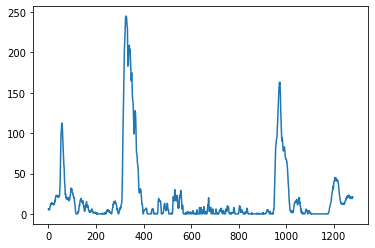

In [59]:
histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
plt.plot(histogram)
plt.show() #to block text output

The two highest peaks from the histogram can be used as a starting point for determining where the lane lines are, and then use sliding windows moving upward in the image (further along the road) to determine where the lane lines go.

#### Lane Pixel Detection - Part 2: Sliding Windows Search

With this histogram we are adding up the pixel values along each column in the image. In our thresholded binary image, pixels are either 0 or 1, so the two most prominent peaks in this histogram will be good indicators of the x-position of the base of the lane lines. We can use that as a starting point for where to search for the lines. From that point, we can use a sliding window, placed around the line centers, to find and follow the lines up to the top of the frame.

![](./img/img_sliding_window_example.png)

The first step to take is to **split the histogram into two sides**, one for each lane line.

#### Lane Pixel Detection - Part 3: Searching Around a Previously Detected Line

### 5. Image Augmentation

### The Pipeline

In [ ]:
'''
for image_path in glob.glob('test_images/test*.jpg'):
    image = mpimg.imread(image_path)
    calibrated = calibrated_camera(image) 
    pipeline = Pipeline(calibrated)
    overlay = pipeline.run(calibrated)
    
    mpimg.imsave(image_path.replace('test_images', 'output_images'), overlay)
    plt.figure(figsize=(12, 12))
    plt.imshow(overlay)
    plt.subplots_adjust(left=0.0, right=1, top=0.9, bottom=0.0)
    plt.show()
'''